# Import librairies

In [4]:
import pandas as pd, numpy as np, os, warnings, seaborn as sns
from datetime import datetime as dt
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
font1 = fm.FontProperties(size=20)
font2 = fm.FontProperties(size=24)

%matplotlib inline

if int(str(sns.__version__).split('.')[1]) > 8 : 
    plt.style.use('seaborn-v0_8-darkgrid')
else:
    plt.style.use('seaborn-darkgrid')
    
sns.set(font_scale=2)
warnings.filterwarnings(action="ignore")

# Outils

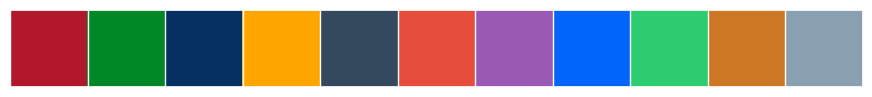

In [5]:
palette = [ "#030aa7", "#e50000", "#d8863b", "#005f6a", "#6b7c85", "#751973",
            "#f5054f", 
            "#030aa7", "#e50000", "#d8863b", "#005f6a", "#6b7c85", "#751973", "#d1e5f0", "#fddbc7",
            "#ffffcb", "#12e193", "#d8dcd6", "#ffdaf0", "#dfc5fe", "#f5054f", "#a0450e",
            "#0339f8", "#f4320c", "#fec615", "#017a79", "#85a3b2", "#fe2f4a", "#a00498", "#b04e0f",
            "#0165fc", "#ff724c", "#fddc5c", "#11875d", "#89a0b0", "#fe828c", "#cb00f5", "#b75203",
            "#0485d1", "#ff7855", "#fbeeac", "#0cb577", "#95a3a6", "#ffb7ce", "#c071fe", "#ca6b02",
            "#92c5de", "#f4a582", "#fef69e", "#18d17b", "#c5c9c7", "#ffcfdc", "#caa0ff", "#cb7723",
            "#d1e5f0", "#fddbc7", "#ffffcb", "#12e193", "#d8dcd6", "#ffdaf0", "#dfc5fe", "#d8863b",
            "#030764", "#be0119", "#dbb40c", "#005249", "#3c4142", "#cb0162", "#5d1451", "#653700",
            "#040348", "#67001f", "#b27a01", "#002d04", "#000000", "#a0025c", "#490648", "#3c0008"
          ]
palette = ['#b2182b','#008827','#053061','#ffa500', '#34495e', '#e74c3c', 
          '#9b59b6', '#0165fc','#2ecc71', '#cb7723', '#89a0b0']
sns.palplot(sns.color_palette(palette))

In [6]:
repertoireRacine  = '.'
nomProjet         = 'Meteo'

repertoireProjet  = os.path.join(repertoireRacine, nomProjet)
repertoireDonnees = os.path.join(repertoireProjet, 'repertoire.donnees')
repertoireImages  = os.path.join(repertoireProjet, 'repertoire.images')


def controleExistenceRepertoire( repertoire, create_if_needed=True):
    """Voir si le répertoire existe. S'il n'existe pas il est créé."""
    path_exists = os.path.exists(repertoire)
    if path_exists:
        if not os.path.isdir(repertoire):
            raise Exception("Trouvé le nom  "+repertoire +" mais c'est un fichier, pas un répertoire")
            # return False
        return True
    if create_if_needed:
        os.makedirs(repertoire)

def sauvegarderImage( fichier):
    """Enregistrez la figure. Appelez la méthode juste avant plt.show ()."""
    controleExistenceRepertoire(repertoireImages)
    plt.savefig(os.path.join(repertoireImages,
                             fichier+f"--{dt.now().strftime('%Y_%m_%d_%H.%M.%S')}.png"), 
                             dpi=600, 
                             bbox_inches='tight')

def sauvegarderImageSNS( sns_plot, fichier):
    """Enregistrez la figure. Appelez la méthode juste avant plt.show ()."""
    controleExistenceRepertoire(repertoireImages)
    fig = sns_plot.get_figure()
    fig.savefig(os.path.join(repertoireImages,fichier+'.png'))
    
controleExistenceRepertoire(repertoireProjet);
controleExistenceRepertoire(repertoireDonnees);
controleExistenceRepertoire(repertoireImages);

In [2]:
!dir ..\donnees\meteo.*

 Le volume dans le lecteur F s'appelle Data
 Le num‚ro de s‚rie du volume est D4F7-8E12

 R‚pertoire de F:\PythonFormation.travail\donnees

15/12/2023  11:27    <DIR>          meteo
10/01/2024  11:19        26ÿ883ÿ781 meteo.gzip
               1 fichier(s)       26ÿ883ÿ781 octets
               1 R‚p(s)  112ÿ570ÿ822ÿ656 octets libres


In [18]:
!pip install pyarrow

In [63]:
donnees = pd.read_parquet('../donnees/meteo.gzip', engine='pyarrow')
# donnees = donnees[donnees.Annee == 2022]

In [64]:
donnees.shape

(3345920, 19)

In [65]:
donnees.head()

,Nom,Latitude,Longitude,Altitude,Zone,DateHeure,DirectionVent,VitesseVent,Temperature,Humidite,Visibilite,Pression,Mois,Annee,AnneeMois,Semaine,MoisJour,JourA,Precipitation
0,Abbeville,50.136,1.834,69,NO,1996-01-01 00:00:00,170.0,2.0,2.89,99.0,NaN,990.9,1,1996,199601,1,101,1,0.0
1,Abbeville,50.136,1.834,69,NO,1996-01-01 03:00:00,130.0,3.0,2.70,99.0,NaN,990.7,1,1996,199601,1,101,1,0.2
2,Abbeville,50.136,1.834,69,NO,1996-01-01 06:00:00,120.0,3.0,2.89,99.0,0.1,990.9,1,1996,199601,1,101,1,0.0
3,Abbeville,50.136,1.834,69,NO,1996-01-01 09:00:00,130.0,4.1,3.60,99.0,0.8,991.1,1,1996,199601,1,101,1,0.0
4,Abbeville,50.136,1.834,69,NO,1996-01-01 12:00:00,100.0,5.1,4.39,99.0,1.6,990.4,1,1996,199601,1,101,1,0.0


In [66]:
donnees.columns

Index(['Nom', 'Latitude', 'Longitude', 'Altitude', 'Zone', 'DateHeure',
       'DirectionVent', 'VitesseVent', 'Temperature', 'Humidite', 'Visibilite',
       'Pression', 'Mois', 'Annee', 'AnneeMois', 'Semaine', 'MoisJour',
       'JourA', 'Precipitation'],
      dtype='object')

In [67]:
donnees.dtypes

Nom                      object
Latitude                float64
Longitude               float64
Altitude                  int16
Zone                     object
DateHeure        datetime64[us]
DirectionVent           float64
VitesseVent             float64
Temperature             float64
Humidite                float64
Visibilite              float64
Pression                float64
Mois                      int32
Annee                     int32
AnneeMois                 int32
Semaine                  UInt32
MoisJour                  int32
JourA                     int32
Precipitation           float64
dtype: object

# Agg

In [68]:
donnees[['Mois', 'Temperature', 'Humidite', 'Visibilite', 'Precipitation',
         'Pression']].groupby(['Mois']).agg('sum')

,Temperature,Humidite,Visibilite,Precipitation,Pression
Mois,,,,,
1,1549836.11,23419000.0,4509388.63,73709.9000,283289851.2
2,1573164.16,20085475.0,4409953.57,58628.3750,257915865.4
3,2459674.83,20827749.0,5070692.38,62896.1500,281921534.1
4,3152957.74,19589419.0,5573167.18,67455.0000,272300064.3
5,4251680.08,20525813.0,5979312.76,75048.2500,281130112.2
6,5107786.74,19402273.0,5957480.47,64656.1125,272626958.8
7,5812981.60,19340580.0,6534907.90,52780.4750,281278311.4
8,5800390.70,19832208.0,6705122.80,60199.6875,281553924.2
9,4725067.53,20045055.0,6109400.25,63587.2500,272272178.6


In [69]:
donnees[['Nom','Mois', 'Temperature', 'Humidite', 'Visibilite', 'Precipitation',
         'Pression']].groupby(['Nom','Mois']).agg('mean')

Temperature   Humidite  Visibilite  Precipitation     Pression
Nom       Mois                                                                
Abbeville 1        4.506655  86.820309   13.107416       0.250201  1008.548837
          2        5.177926  83.386775   14.351412       0.251403  1008.328830
          3        7.187374  80.342539   14.187474       0.220982  1007.574949
          4        9.897527  75.544287   16.984609       0.198773  1006.098626
          5       12.944717  77.929048   18.054881       0.231426  1007.747703
...                     ...        ...         ...            ...          ...
Troyes    8       19.706972  69.936972   19.828849       0.232926  1002.366013
          9       15.784530  75.335894   17.942421       0.205566  1003.545106
          10      11.941529  83.306426   15.607446       0.271383  1002.457746
          11       7.249611  87.528037   13.433031       0.225201  1001.855472
          12       4.489998  87.417829   13.051019       0.229523  1003.693845

[504 rows x 5 columns]

In [70]:
donnees[donnees.Nom == 'Strasbourg'][['Mois', 'Temperature', 'Humidite', 'Visibilite',
       'Pression',  'Precipitation']].groupby('Mois').agg(['mean','std'])

Temperature             Humidite            Visibilite             \
            mean       std       mean        std       mean        std   
Mois                                                                     
1       2.432723  4.878333  85.268532  10.054144  16.160167  16.643209   
2       3.731469  4.979714  79.230112  13.762057  18.523502  16.681383   
3       7.098901  5.190747  71.954991  17.508231  19.651890  15.046922   
4      11.355550  5.605623  66.217853  19.973953  25.017325  15.732702   
5      15.654032  5.232285  68.060681  19.334156  26.158246  16.209024   
6      19.282235  5.196740  67.593091  18.502273  27.342937  15.287557   
7      20.552062  5.130661  67.611617  19.201510  29.117156  15.078681   
8      20.193214  5.218444  71.295769  18.922550  28.139647  16.490888   
9      15.932489  5.139926  75.416154  17.547304  25.578659  16.992388   
10     11.329875  4.742344  82.778551  14.179699  19.370088  16.542561   
11      6.336728  4.280121  87.064506  10.273094  15.998404  15.551468   
12      3.290958  4.622844  86.791242   9.547709  16.587148  16.696367   

         Pression            Precipitation            
             mean        std          mean       std  
Mois                                                  
1     1001.427572  10.513900      0.133401  0.543805  
2     1000.540724  10.511247      0.155270  0.595189  
3      998.965046   9.692004      0.156008  0.619504  
4      996.815807   7.648551      0.177179  0.787544  
5      998.024775   6.239249      0.299832  1.393614  
6      998.534205   5.355061      0.304741  1.467160  
7      998.434894   4.378662      0.266111  1.384155  
8      998.226641   4.308863      0.256440  1.274931  
9      999.564450   6.209226      0.203586  1.068963  
10     999.170068   7.584423      0.250094  1.003367  
11     998.349037   9.989041      0.210316  0.794592  
12    1000.075349  11.340763      0.178748  0.657178

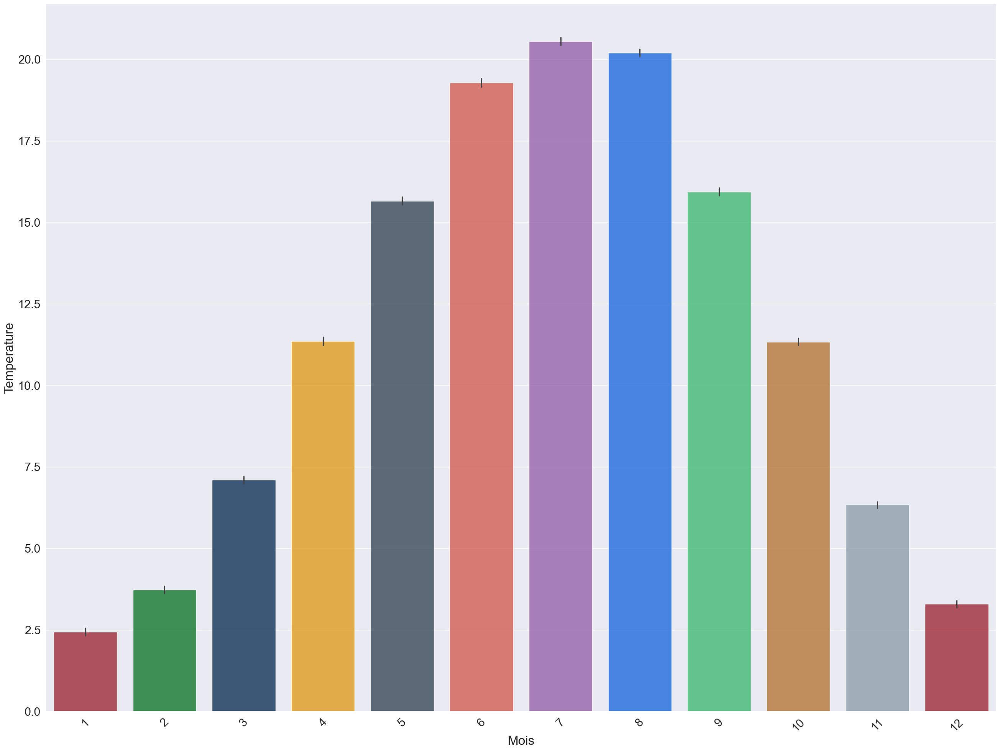

In [71]:
plt.figure(figsize=(32,24))
gbarplot = sns.barplot(x='Mois',y='Temperature',data=donnees[donnees.Nom == 'Strasbourg'],
                       palette=palette,alpha=0.8,estimator='mean')
xloc, xlabels = plt.xticks()
gbarplot.set_xticklabels(xlabels, rotation=45);
sauvegarderImage('barplot Temperature Strasbourg')

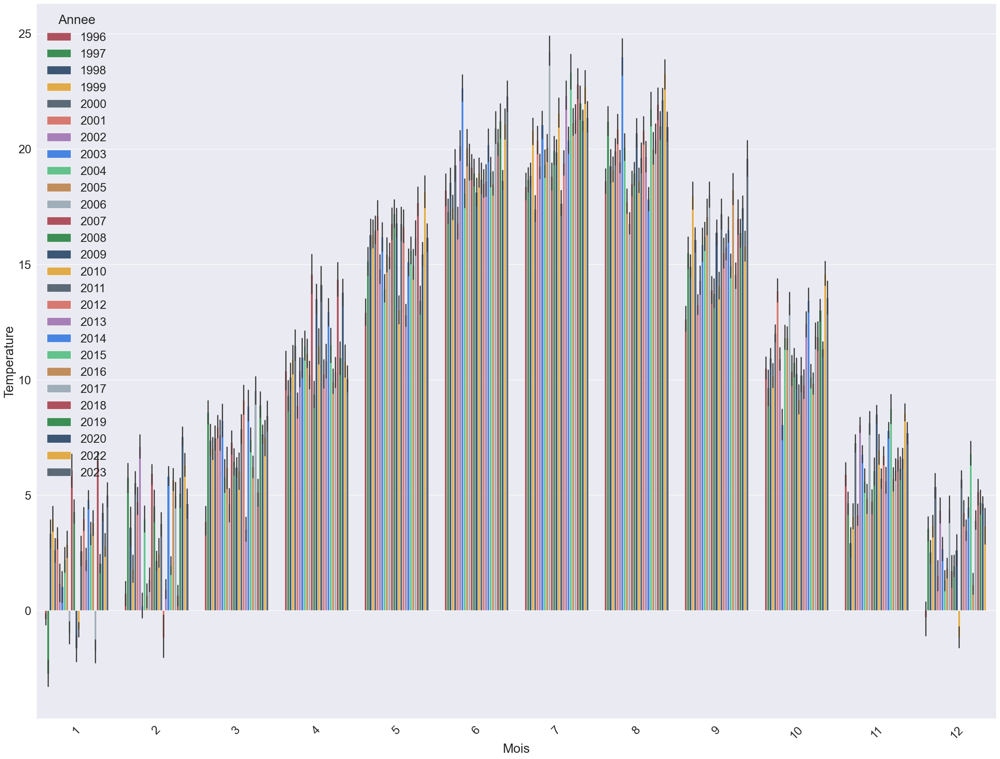

In [73]:
plt.figure(figsize=(32,24))
gbarplot = sns.barplot(x='Mois',y='Temperature',hue='Annee', 
                       data=donnees[donnees.Nom == 'Strasbourg'],
                       palette=palette,alpha=0.8,estimator='mean')
xloc, xlabels = plt.xticks()
gbarplot.set_xticklabels(xlabels, rotation=45);
sauvegarderImage('barplot Temperature Strasbourg')

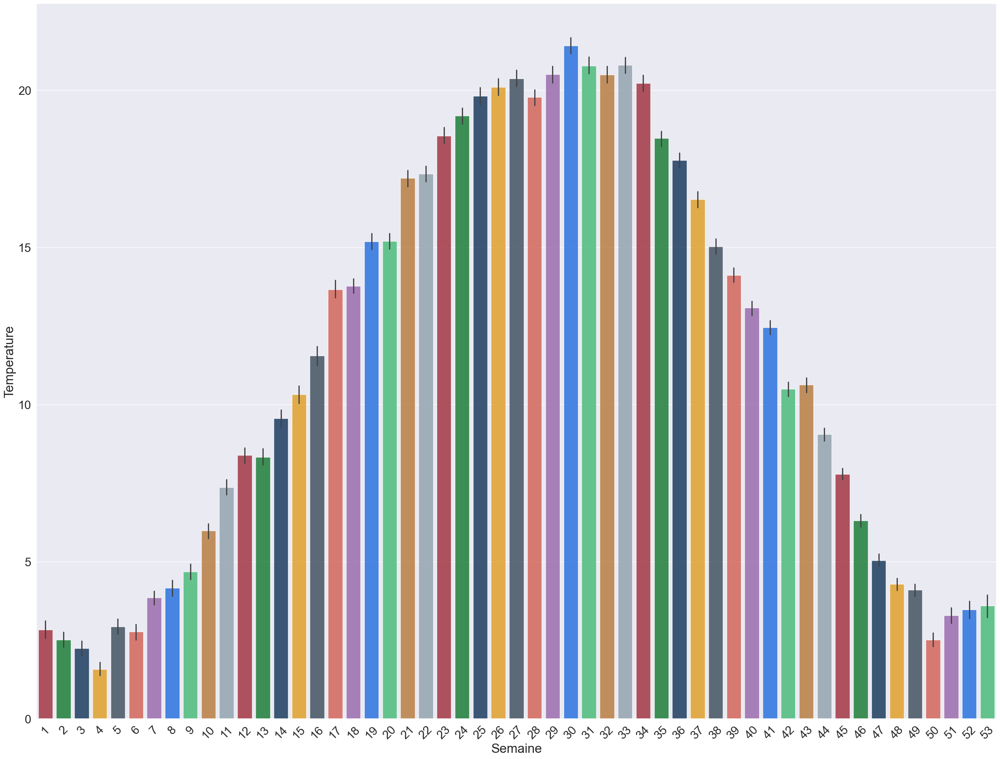

In [72]:
plt.figure(figsize=(32,24))
gbarplot = sns.barplot(x='Semaine',y='Temperature',data=donnees[donnees.Nom == 'Strasbourg'],
                       palette=palette,alpha=0.8,estimator='mean')
xloc, xlabels = plt.xticks()
gbarplot.set_xticklabels(xlabels, rotation=45);
sauvegarderImage('barplot Temperature Strasbourg-Semaine')

In [ ]:
donnees[(donnees.Nom == 'Strasbourg')].plot.line(x='DateHeure',y='Temperature',figsize=(100,30),lw=1)

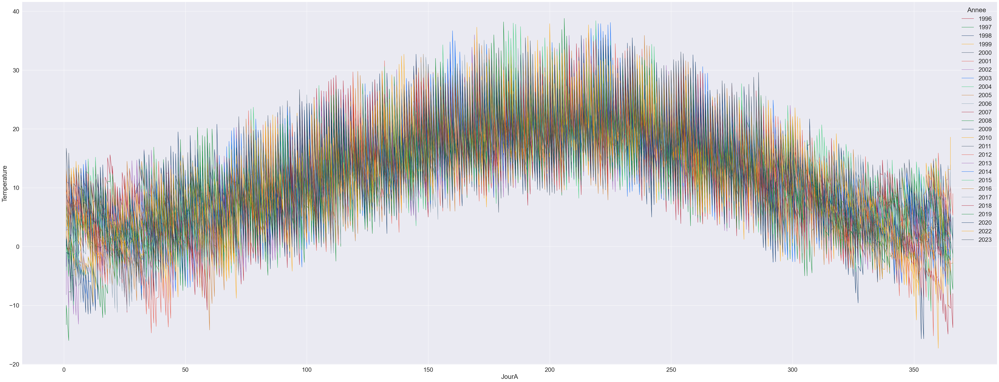

In [84]:
plt.figure(figsize=(64,24))

ax = sns.lineplot(x  ='JourA',
                  y  ='Temperature',
                  hue='Annee',             
                  data=donnees[donnees.Nom == 'Strasbourg'], 
                  estimator=None, 
                  lw=1, 
                  ci=None, 
                  palette= palette);
# ax.set_xticklabels(donnees.Semaine,rotation=90);

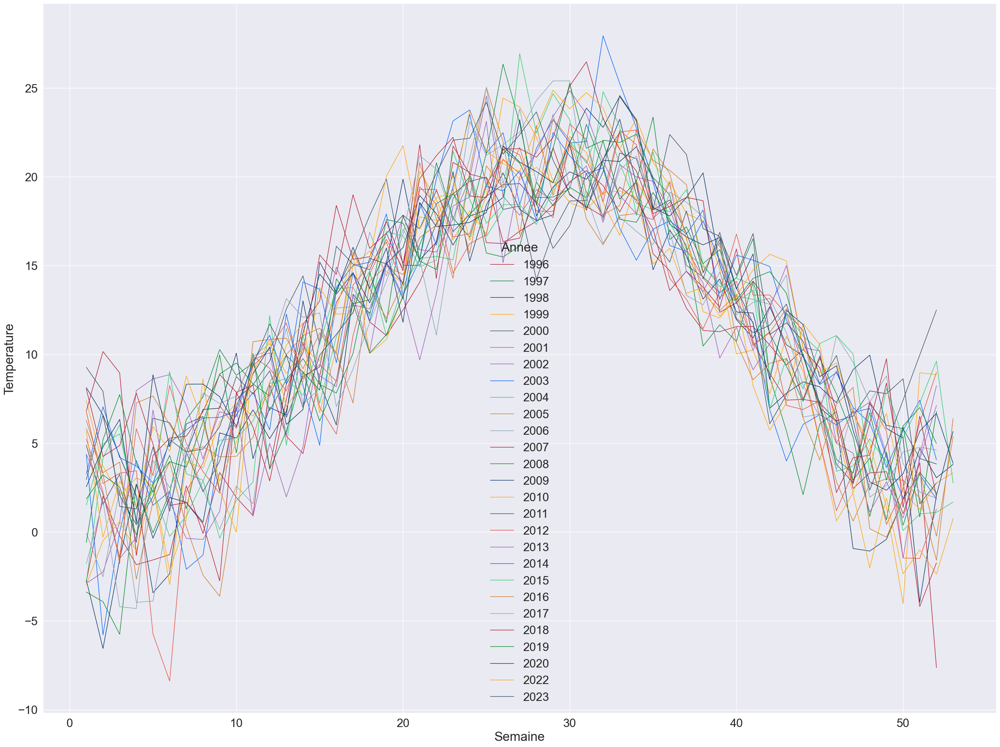

In [86]:
plt.figure(figsize=(32,24))

ax = sns.lineplot(x  ='Semaine',
                  y  ='Temperature',
                  hue='Annee',             
                  data=donnees[donnees.Nom == 'Strasbourg'], 
                  # estimator='mean', 
                  lw=1, 
                  ci=None, 
                  palette= palette);
# ax.set_xticklabels(donnees.Semaine,rotation=90);

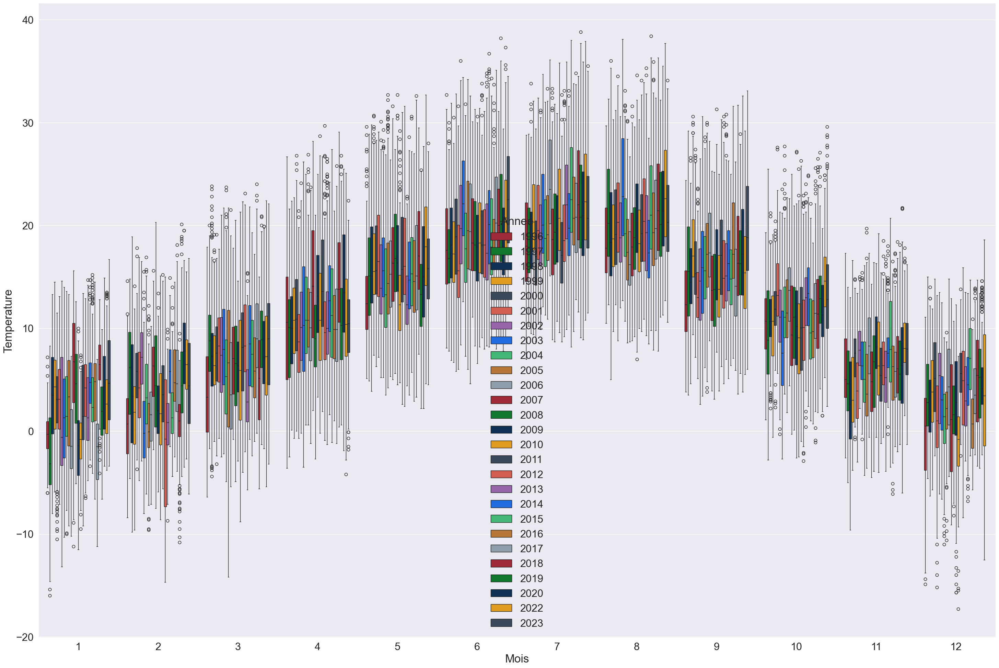

In [88]:
plt.figure(figsize=(36,24))
sns.boxplot(x='Mois',y='Temperature',data=donnees[donnees.Nom == 'Strasbourg'],hue='Annee', palette=palette);

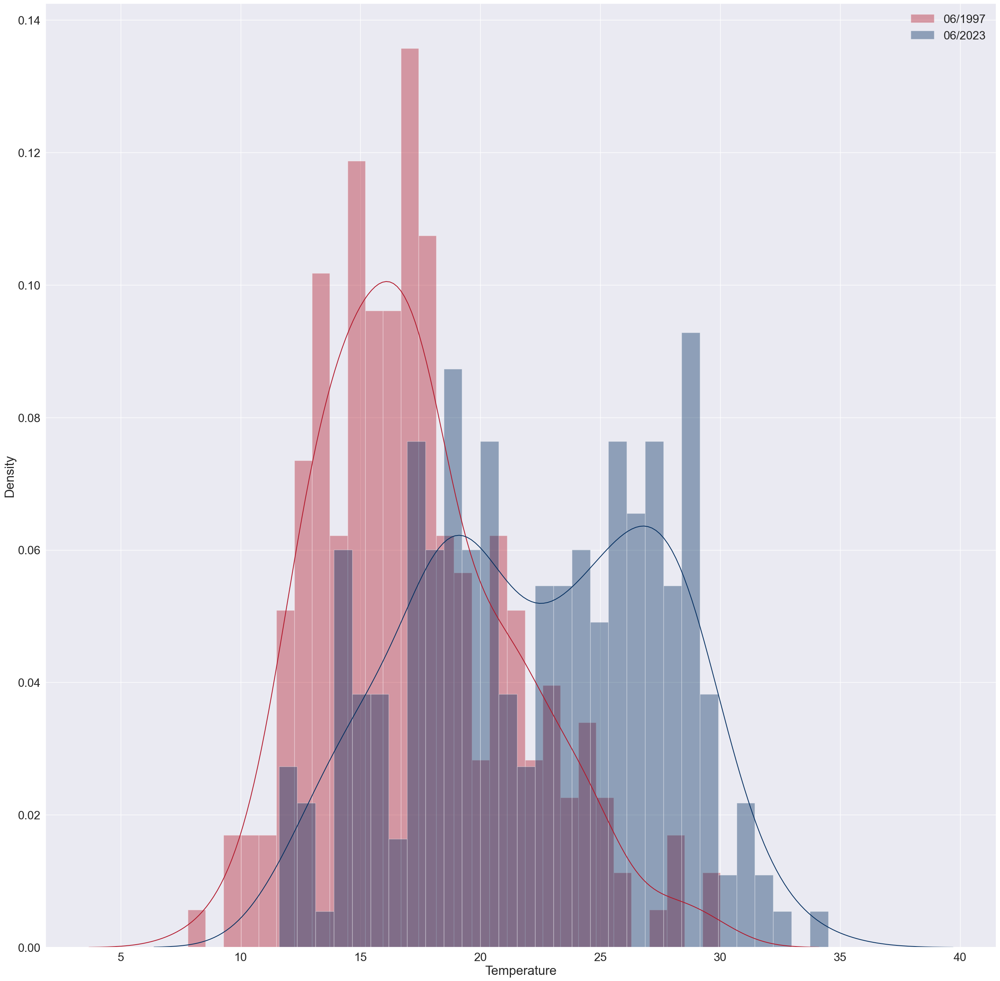

In [104]:
plt.figure(figsize=(32,32))
sns.distplot(donnees['Temperature'][(donnees.Nom == 'Strasbourg')&(donnees.AnneeMois == 199706)],color=palette[0], label='06/1997', hist_kws=dict(alpha=0.4),bins=30)
sns.distplot(donnees['Temperature'][(donnees.Nom == 'Strasbourg')&(donnees.AnneeMois == 202306)],color=palette[2], label='06/2023', hist_kws=dict(alpha=0.4),bins=30)
plt.legend();

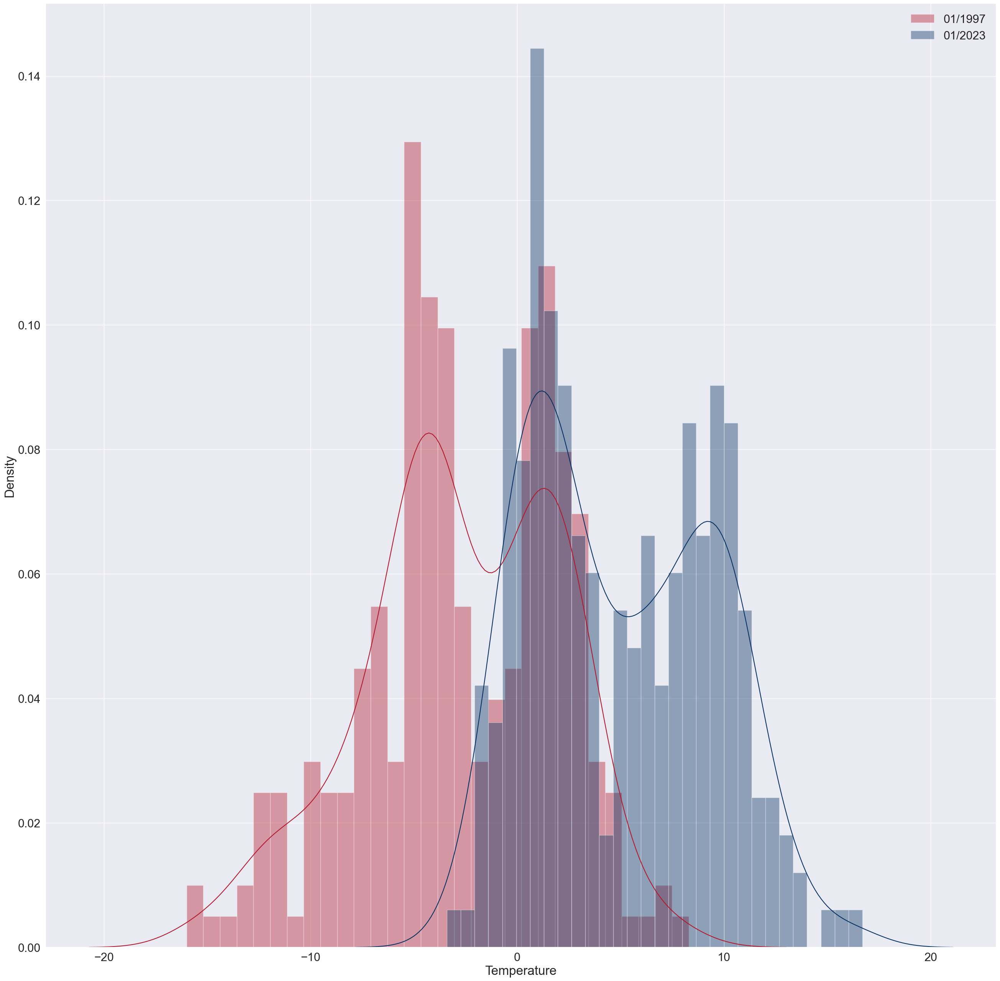

In [101]:
plt.figure(figsize=(32,32))
sns.distplot(donnees['Temperature'][(donnees.Nom == 'Strasbourg')&(donnees.AnneeMois == 199701)],color=palette[0], label='01/1997', hist_kws=dict(alpha=0.4),bins=30)
sns.distplot(donnees['Temperature'][(donnees.Nom == 'Strasbourg')&(donnees.AnneeMois == 202301)],color=palette[2], label='01/2023', hist_kws=dict(alpha=0.4),bins=30)
plt.legend();

In [33]:
donnees.columns

Index(['Nom', 'Latitude', 'Longitude', 'Altitude', 'Zone', 'DateHeure',
       'DirectionVent', 'VitesseVent', 'Temperature', 'Humidite', 'Visibilite',
       'Pression', 'Mois', 'Annee', 'AnneeMois', 'Semaine', 'MoisJour',
       'JourA', 'Precipitation'],
      dtype='object')

In [39]:
donnees[['Nom', 'Latitude', 'Longitude', 'Altitude','Zone', 
         'Temperature','Humidite', 'Visibilite', 'Pression', 'Precipitation',
         'Mois']
        ].pivot_table(index=['Nom', 'Latitude', 'Longitude', 'Altitude','Zone'],
                      columns=['Mois'], #,'Semaine'
                      values = 'Temperature',
                     aggfunc = 'median')

,,,,Mois,1,2,3,4,5,6,7,8,9,10,11,12
Nom,Latitude,Longitude,Altitude,Zone,,,,,,,,,,,,
Abbeville,50.136000,1.834000,69,NO,4.20,7.70,8.35,9.90,13.80,16.05,18.95,19.90,15.20,14.70,9.10,3.00
Ajaccio,41.918000,8.792667,5,SE,8.35,9.80,11.70,12.65,19.70,24.95,26.30,26.05,22.00,18.75,14.30,12.15
Alencon,48.445500,0.110167,143,NO,5.10,7.30,8.55,10.35,15.05,17.10,20.10,20.35,15.20,14.90,9.00,2.85
Bale,47.614333,7.510000,263,NE,1.80,6.10,7.15,10.55,17.30,19.95,22.25,21.10,15.30,14.80,8.20,2.90
Bastia,42.540667,9.485167,10,SE,9.10,10.40,10.60,12.90,19.80,25.00,27.45,26.00,22.20,17.90,14.00,10.90
Belle Ile,47.294333,-3.218333,34,NO,8.35,9.80,10.60,11.90,15.50,17.10,19.75,19.75,17.60,16.50,14.10,7.30
Bordeaux,44.830667,-0.691333,47,SO,4.80,9.40,11.00,12.40,18.80,20.80,23.60,23.55,19.05,18.30,11.70,8.20
Bourges,47.059167,2.359833,161,NO,2.80,7.60,9.20,11.40,17.50,19.95,22.30,22.85,16.45,16.00,9.05,4.60
Brest,48.444167,-4.412000,94,NO,8.15,8.95,9.50,10.30,13.50,15.10,17.65,18.20,15.80,15.00,11.50,5.95


In [45]:
temperatures = donnees[['Nom', 'Latitude', 'Longitude', 'Altitude','Zone', 
                'Temperature','Mois']].pivot_table(index=['Nom', 'Latitude', 'Longitude', 'Altitude','Zone'],
                           columns='Mois')
temperatures.columns = ['janv.','févr.','mars','avr.','mai','juin','juill.','août','sept.','oct.','nov.','déc.']
temperatures.head()

,,,,,janv.,févr.,mars,avr.,mai,juin,juill.,août,sept.,oct.,nov.,déc.
Nom,Latitude,Longitude,Altitude,Zone,,,,,,,,,,,,
Abbeville,50.136000,1.834000,69,NO,4.506655,5.177926,7.187374,9.897527,12.944717,15.927296,17.647393,17.950155,15.357589,12.012794,7.906183,5.095252
Ajaccio,41.918000,8.792667,5,SE,9.013655,9.098936,10.988942,13.637566,17.484245,21.511102,23.863274,23.911528,20.787859,17.452011,13.180196,10.003745
Alencon,48.445500,0.110167,143,NO,4.579525,5.122644,7.419778,10.159313,13.537345,16.898559,18.620894,18.550157,15.467162,11.902327,7.772221,4.985914
Bale,47.614333,7.510000,263,NE,2.157652,3.353058,6.649048,10.686277,14.948834,18.782333,20.190336,19.770608,15.432660,11.191408,6.100353,2.917112
Bastia,42.540667,9.485167,10,SE,9.188277,9.326488,11.185525,13.803358,17.862716,22.039493,24.835508,24.852453,21.187113,17.405394,13.241846,10.128839


In [50]:
temperatures.max().max(),temperatures.min().min()

(25.297931831311402, 1.1974276201505734)

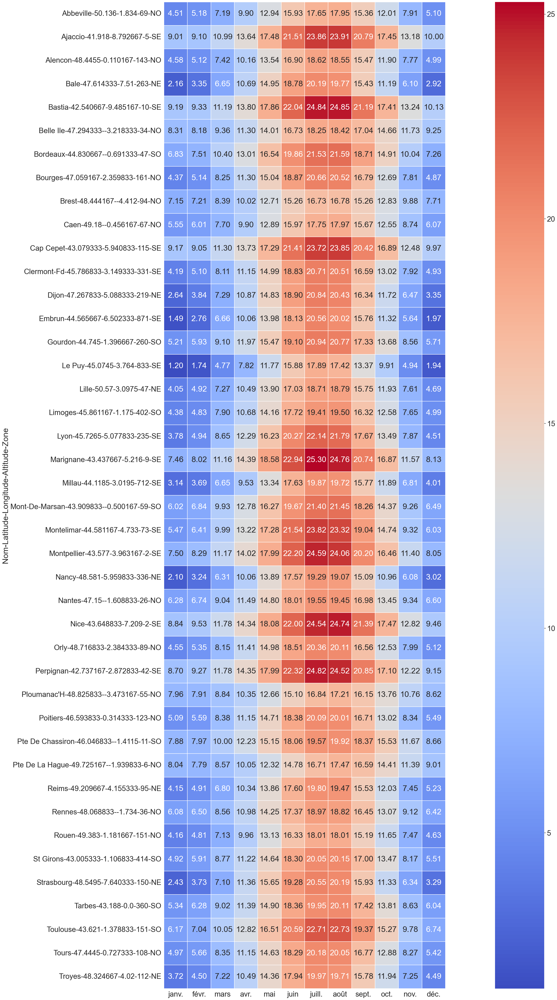

In [52]:
plt.figure(figsize=(64,64))
sns.set(font_scale=2.4)
# plt.title('Correlation Pearson des variables', y=1.05, size=18)
sns.heatmap(temperatures,linewidths=0.3,
            vmin=temperatures.min().min(), 
            vmax=temperatures.max().max(), 
            fmt= '.2f', 
            square=True, cmap='coolwarm', linecolor='white', annot=True)
sns.set(font_scale=2)

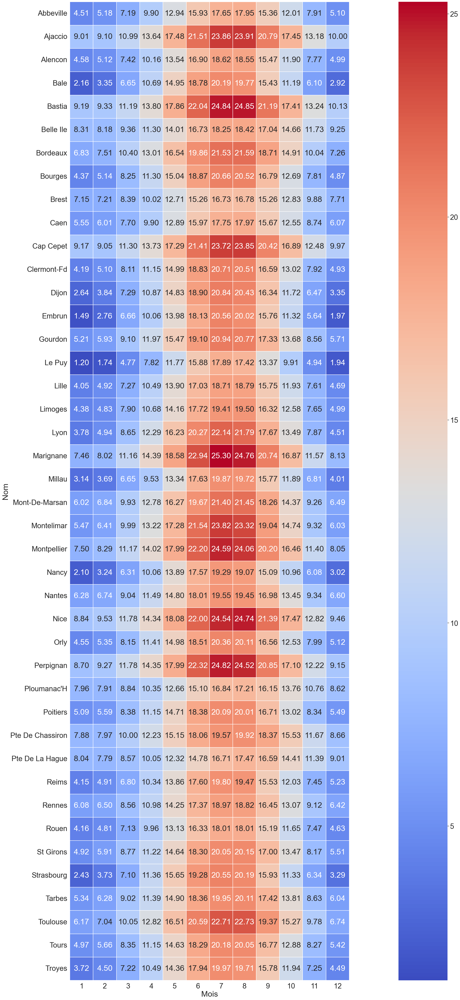

In [57]:
plt.figure(figsize=(64,64))
sns.set(font_scale=2.4)
# plt.title('Correlation Pearson des variables', y=1.05, size=18)
sns.heatmap(donnees[['Nom', 'Latitude', 'Longitude', 'Altitude','Zone', 
         'Temperature','Humidite', 'Visibilite', 'Pression', 'Precipitation',
         'Mois']
        ].pivot_table(index=['Nom'],
                      columns=['Mois'], #,'Semaine'
                      values = 'Temperature',
                     aggfunc = 'mean'),
            linewidths=0.3,
            fmt= '.2f', 
            square=True, cmap='coolwarm', linecolor='white', annot=True)
sns.set(font_scale=2)


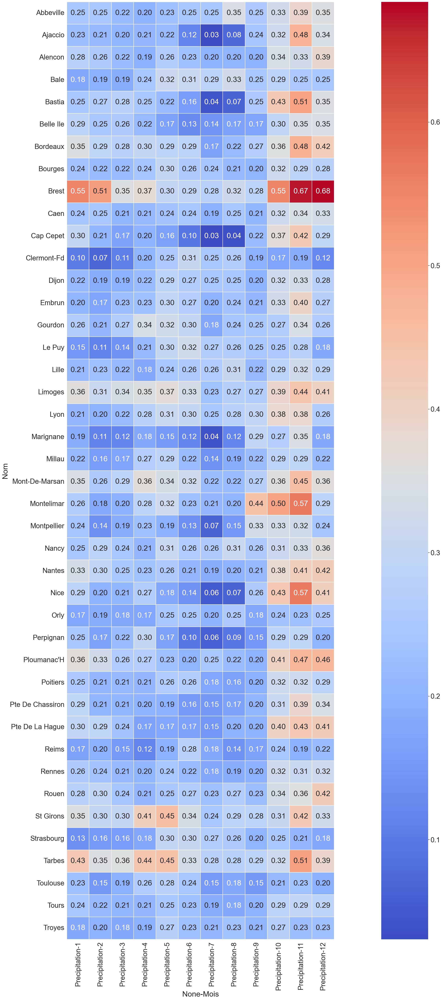

In [56]:
plt.figure(figsize=(64,64))
sns.set(font_scale=2.4)
# plt.title('Correlation Pearson des variables', y=1.05, size=18)
sns.heatmap(donnees[['Nom', 'Latitude', 'Longitude', 'Altitude','Zone', 
         'Temperature','Humidite', 'Visibilite', 'Pression', 'Precipitation',
         'Mois']
        ].pivot_table(index=['Nom'],
                      columns=['Mois'], #,'Semaine'
                      values = 'Precipitation',
                     aggfunc = 'mean'),
            linewidths=0.3,
            fmt= '.2f', 
            square=True, cmap='coolwarm', linecolor='white', annot=True)
sns.set(font_scale=2)


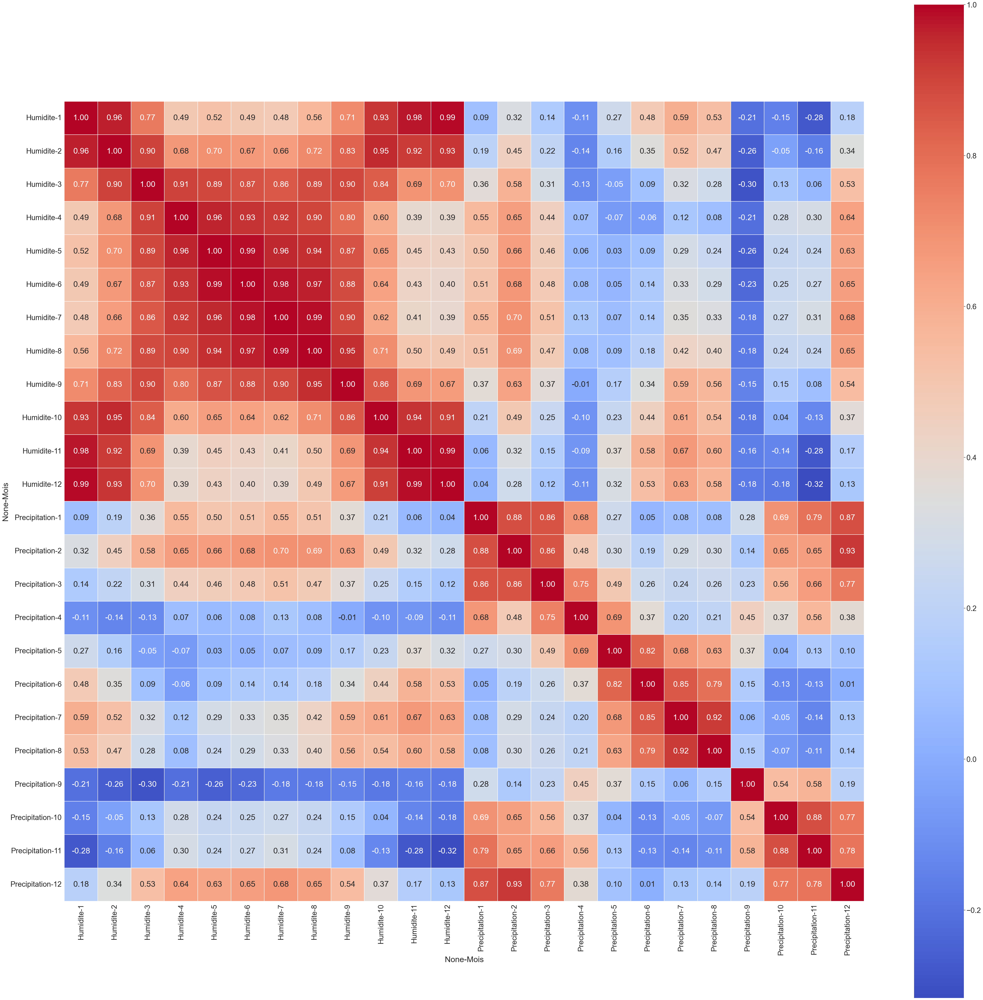

In [62]:
plt.figure(figsize=(64,64))
sns.set(font_scale=2.4)
# plt.title('Correlation Pearson des variables', y=1.05, size=18)
sns.heatmap(donnees[['Nom', 'Latitude', 'Longitude', 'Altitude','Zone', 
         'Temperature','Humidite', 'Visibilite', 'Pression', 'Precipitation',
         'Mois']
        ].pivot_table(index=['Nom'],
                      columns=['Mois'], #,'Semaine'
                      values = ['Precipitation','Humidite'],
                     aggfunc = 'mean').corr(),
            linewidths=0.3,
            fmt= '.2f', 
            square=True, cmap='coolwarm', linecolor='white', annot=True)
sns.set(font_scale=2)
